In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from langdetect import detect
import os

from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lower, regexp_replace, concat_ws, udf, array, lit, rand
from pyspark.sql.functions import col, size, explode, split
from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer, IDF, Word2Vec, Word2VecModel
from pyspark.ml.clustering import KMeans, KMeansModel
from pyspark.ml.feature import PCA as PCAml, PCAModel
from pyspark.ml.linalg import Vectors, DenseVector, SparseVector, VectorUDT
from pyspark.sql.types import BooleanType, FloatType

In [2]:
spark = SparkSession.builder.appName('BDClustering') \
    .config("spark.sql.shuffle.partitions", "100") \
    .config("spark.driver.memory", "16g") \
    .config("spark.executor.memory", "16g") \
    .config("spark.executor.cores", "4") \
    .config("spark.task.cpus", "4") \
    .config("spark.driver.maxResultSize", "8g") \
    .getOrCreate()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/06/07 17:26:10 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
import logging
spark.sparkContext.setLogLevel("ERROR")
logging.getLogger("py4j").setLevel(logging.ERROR)

In [4]:
config = {
    "word2vec_model_path": {"path": "models/word2Vec_model_v2", "save": True},
    "vectorizer_model_path": {"path": "models/vectorizer_model_v2", "save": True},
    "idf_model_path": {"path": "models/idf_model_v2", "save": True},
    "pca_model_path": {"path": "models/pca_model_v2", "save": True},
    "kmeans_model_path": {"path": "models/kmeans_model_v5", "save": True}
}

In [5]:
data_path = "../../data/dblp-ref/*.json"
df = spark.read.json(data_path)

In [6]:
df.count()

3079007

In [6]:
def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False

is_english_udf = udf(is_english, BooleanType())

df = df.filter(df.abstract.isNotNull() & df.title.isNotNull())
df = df.withColumn("combined_text", concat_ws(" ", col("title"), col("abstract")))
df = df.withColumn("is_english", is_english_udf(col("combined_text")))
df = df.filter(col("is_english") == True).drop("is_english")

In [7]:
df = df.withColumn('combined_text', lower(col('combined_text')))
df = df.withColumn('combined_text', regexp_replace(col('combined_text'), '[^a-zA-Z\s]', ''))

In [8]:
tokenizer = Tokenizer(inputCol='combined_text', outputCol='words')
df = tokenizer.transform(df)

In [9]:
remover = StopWordsRemover(inputCol='words', outputCol='filtered')
custom_stop_words = ['doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 'al.', 'Elsevier', 'PMC', 'CZI', 'www']
remover.setStopWords(remover.getStopWords() + custom_stop_words)
df = remover.transform(df)

In [11]:
use_word2vec = True

In [12]:
if use_word2vec:
    if os.path.exists(config["word2vec_model_path"]["path"]):
        word2Vec_model = Word2VecModel.load(config["word2vec_model_path"]["path"])
        print(f'Loaded word2vec_model from: {config["word2vec_model_path"]["path"]}')
    else:
        word2Vec = Word2Vec(vectorSize=50, seed=42, inputCol='filtered', outputCol='features')
        word2Vec_model = word2Vec.fit(df)

        if config["word2vec_model_path"]["save"]:
            word2Vec_model.save(config["word2vec_model_path"]["path"])
            print(f'Saved word2vec_model at: {config["word2vec_model_path"]["path"]}')
            
    vectorized_data = word2Vec_model.transform(df)
else:
    if os.path.exists(config["vectorizer_model_path"]["path"]) and os.path.exists(config["idf_model_path"]["path"]):
        vectorizer_model = CountVectorizerModel.load(config["vectorizer_model_path"]["path"])
        idf_model = IDFModel.load(config["idf_model_path"]["path"])
        print(f'Loaded vectorizer_model from: {config["vectorizer_model_path"]["path"]}')
        print(f'Loaded idf_model from: {config["idf_model_path"]["path"]}')
    else:
        vectorizer = CountVectorizer(inputCol='filtered', outputCol='raw_features')
        vectorizer_model = vectorizer.fit(df)
        
        idf = IDF(inputCol='raw_features', outputCol='features')
        idf_model = idf.fit(vectorized_data)

        if config["vectorizer_model_path"]["save"]:
            vectorizer_model.save(config["vectorizer_model_path"]["path"])
            print(f'Saved vectorizer_model at: {config["vectorizer_model_path"]["path"]}')
            
        if config["idf_model_path"]["save"]:
            idf_model.save(config["idf_model_path"]["path"])
            print(f'Saved idf_model at: {config["idf_model_path"]["path"]}')
    
    vectorized_data = vectorizer_model.transform(df)
    vectorized_data = idf_model.transform(vectorized_data)

Loaded word2vec_model from: models/word2Vec_model_v2


In [13]:
def to_dense(v):
    if isinstance(v, SparseVector):
        return DenseVector(v.toArray())
    elif isinstance(v, DenseVector):
        return v
    else:
        raise TypeError("Unsupported vector type")

if not use_word2vec:
    to_dense_udf = udf(to_dense, VectorUDT())
    vectorized_data = vectorized_data.withColumn('features_dense', to_dense_udf(col('features')))
    features_col = 'features_dense'
else:
    features_col = 'features'

In [57]:
pca = PCAml(inputCol=features_col, outputCol='pca_features', k=50)
pca_model = pca.fit(vectorized_data)
explained_variance = pca_model.explainedVariance.cumsum()
k = (explained_variance < 0.95).sum() + 1

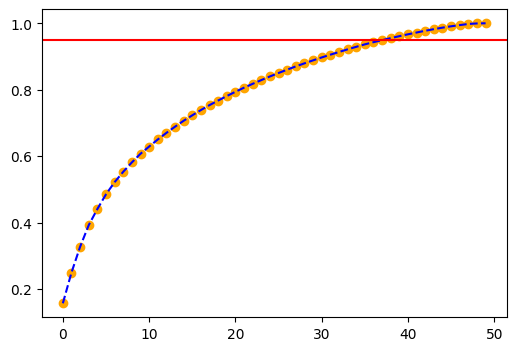

In [17]:
plt.figure(figsize=[6, 4])
plt.plot(np.arange(50), explained_variance, "--", color="blue")
plt.scatter(np.arange(50), explained_variance, color="orange")
plt.axhline(0.95, color="red")

In [18]:
k

39

In [14]:
if os.path.exists(config["pca_model_path"]["path"]):
    pca_model = PCAModel.load(config["pca_model_path"]["path"])
    print(f'Loaded pca_model from: {config["pca_model_path"]["path"]}')
else:
    pca = PCAml(k=k, inputCol=features_col, outputCol='pca_features')
    pca_model = pca.fit(vectorized_data)

    if config["pca_model_path"]["save"]:
        pca_model.save(config["pca_model_path"]["path"])
        print(f'Saved pca_model at: {config["pca_model_path"]["path"]}')

pca_data = pca_model.transform(vectorized_data)

Loaded pca_model from: models/pca_model_v2


In [18]:
sample_fraction = 0.001
sampled_pca_data = pca_data.sample(withReplacement=False, fraction=sample_fraction, seed=42)

sampled_pca_data = sampled_pca_data.repartition(64)
sampled_pca_data = sampled_pca_data.cache()

In [ ]:
pca_data = pca_data.repartition(64)
pca_data = pca_data.cache()

In [ ]:
# Full data clustering

In [ ]:
wssse_list = []
k_values = list(range(10, 101, 10))

for k in k_values:
    kmeans = KMeans(k=k, seed=42, featuresCol='pca_features')
    model = kmeans.fit(pca_data)
    wssse = model.summary.trainingCost
    wssse_list.append(wssse)
    print(f"Training cost for k={k}: {wssse}")

In [27]:
wssse_list

[589363.2853698177,
 491017.930658064,
 441598.2733646168,
 412829.36131676537,
 395269.60001449945,
 377805.3311710827,
 368478.9009048656,
 356717.7647930327,
 348394.10784634145,
 342963.34454503155]

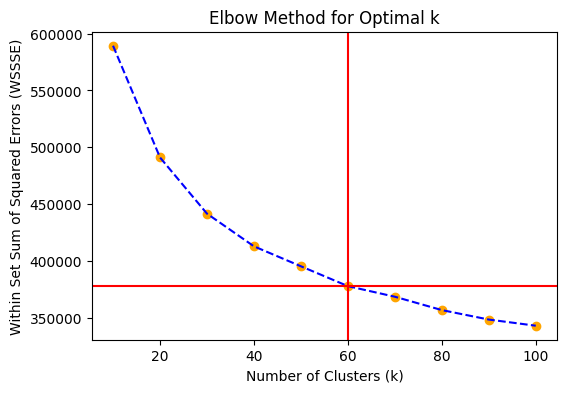

In [29]:
plt.figure(figsize=[6, 4])
plt.plot(k_values, wssse_list, "--", color="blue")
plt.scatter(k_values, wssse_list, color="orange")
plt.axhline(377805.33, color="red")
plt.axvline(60, color="red")
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within Set Sum of Squared Errors (WSSSE)")
plt.show()

In [ ]:
# K approximation with a smaller subset (values are scaled due to the number of datapoints)

In [43]:
wssse_list = []
k_values = list(range(5, 101, 5))

for k in k_values:
    kmeans = KMeans(k=k, seed=42, featuresCol='pca_features')
    model = kmeans.fit(sampled_pca_data)
    wssse = model.summary.trainingCost
    wssse_list.append(wssse)
    print(f"Training cost for k={k}: {wssse}")

Training cost for k=5: 677.6990173646027
Training cost for k=10: 576.229368117658
Training cost for k=15: 520.2819616085989
Training cost for k=20: 482.493973570812
Training cost for k=25: 458.666069985741
Training cost for k=30: 435.89361435731746
Training cost for k=35: 421.08526320963125
Training cost for k=40: 403.7722403034161
Training cost for k=45: 395.5615110716189
Training cost for k=50: 384.5814508102694
Training cost for k=55: 376.4413653856956
Training cost for k=60: 367.51330139561765
Training cost for k=65: 363.6972975391116
Training cost for k=70: 352.13651800243815
Training cost for k=75: 349.48706056777735
Training cost for k=80: 344.1469105127114
Training cost for k=85: 338.61332040732026
Training cost for k=90: 336.6863026238131
Training cost for k=95: 331.0359303430227
Training cost for k=100: 326.59021351368307


In [2]:
wssse_list = [
    677.6990173646027,  # for k=5
    576.229368117658,   # for k=10
    520.2819616085989,  # for k=15
    482.493973570812,   # for k=20
    458.666069985741,   # for k=25
    435.89361435731746, # for k=30
    421.08526320963125, # for k=35
    403.7722403034161,  # for k=40
    395.5615110716189,  # for k=45
    384.5814508102694,  # for k=50
    376.4413653856956,  # for k=55
    367.51330139561765, # for k=60
    363.6972975391116,  # for k=65
    352.13651800243815, # for k=70
    349.48706056777735, # for k=75
    344.1469105127114,  # for k=80
    338.61332040732026, # for k=85
    336.6863026238131,  # for k=90
    331.0359303430227,  # for k=95
    326.59021351368307  # for k=100
]
k_values = list(range(5, 101, 5))

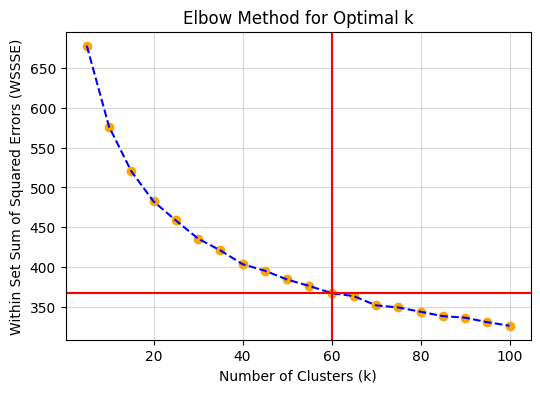

In [3]:
# Plotting the results of the Elbow Method
plt.figure(figsize=[6, 4])
plt.plot(k_values, wssse_list, "--", color="blue")
plt.scatter(k_values, wssse_list, color="orange")
plt.axhline(367.51, color="red")
plt.axvline(60, color="red")
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within Set Sum of Squared Errors (WSSSE)")
plt.grid(True, alpha=0.5)
plt.show()

In [38]:
if os.path.exists(config["kmeans_model_path"]["path"]):
    model = KMeansModel.load(config["kmeans_model_path"]["path"])
    print(f'Loaded kmeans_model from: {config["kmeans_model_path"]["path"]}')
else:
    optimal_k = 60
    kmeans = KMeans(k=optimal_k, seed=42, featuresCol='pca_features')
    model = kmeans.fit(pca_data)

    if config["kmeans_model_path"]["save"]:
        model.save(config["kmeans_model_path"]["path"])
        print(f'Saved kmeans_model at: {config["kmeans_model_path"]["path"]}')

pca_data = model.transform(pca_data)

Saved kmeans_model at: models/kmeans_model_v5


In [39]:
summary = model.summary
wssse = summary.trainingCost
print("Within Set Sum of Squared Errors = " + str(wssse))

centers = model.clusterCenters()
print("Cluster Centers: ")
for center in centers:
    print(center)

Within Set Sum of Squared Errors = 377805.3311710827
Cluster Centers: 
[-0.04972905  0.14412594 -0.14309258  0.15149645 -0.01299709 -0.05824663
 -0.0106218   0.23273408  0.32034763 -0.10473769 -0.05460466  0.20231888
 -0.17879622 -0.00093266 -0.12493629 -0.02628622 -0.20757094  0.07196672
 -0.03711428 -0.06319182 -0.05197319  0.01544405 -0.13835269  0.08986605
  0.05750478 -0.04257487 -0.11099087  0.02659432 -0.08260061  0.01333435
 -0.02050012  0.01982974 -0.05582534 -0.03754148 -0.02256543  0.01702622
 -0.06564587  0.01413655 -0.02733842]
[-0.08014132 -0.12578135 -0.13167833  0.0206192   0.0396349   0.01601944
 -0.14969877 -0.10320879 -0.01452548  0.05413735  0.0286561   0.00311682
  0.04831874  0.04904873  0.03279529  0.05776152 -0.03093938 -0.07378059
 -0.05171738  0.01080091 -0.03578055 -0.00254867 -0.01873637 -0.00130543
  0.02882232 -0.04677994  0.00225396 -0.02593696 -0.00091862 -0.00669838
 -0.02364208  0.01370883 -0.02620856 -0.04164235  0.00692555  0.01147903
  0.00102791 -0

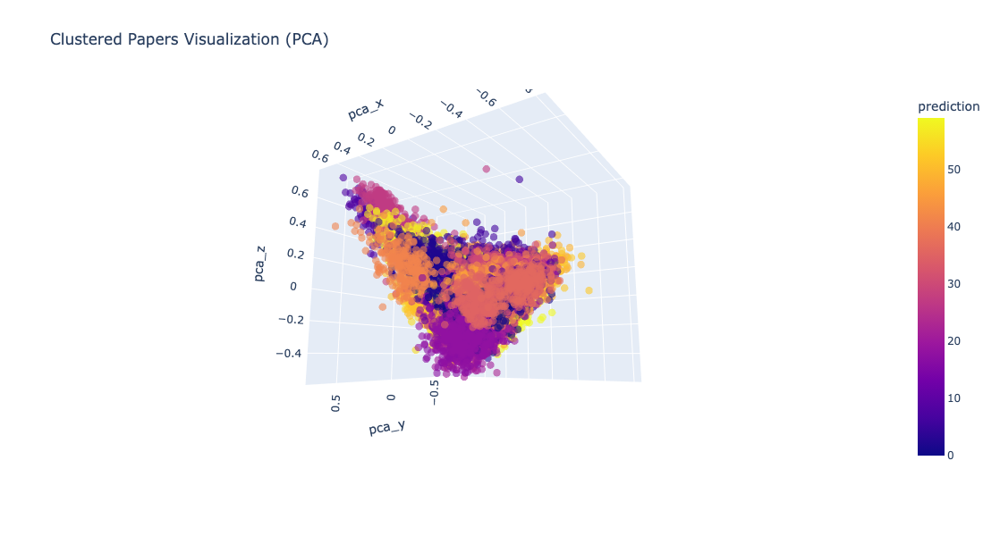

Exception in thread "serve-DataFrame" java.net.SocketTimeoutException: Accept timed out
	at java.base/java.net.PlainSocketImpl.socketAccept(Native Method)
	at java.base/java.net.AbstractPlainSocketImpl.accept(AbstractPlainSocketImpl.java:458)
	at java.base/java.net.ServerSocket.implAccept(ServerSocket.java:565)
	at java.base/java.net.ServerSocket.accept(ServerSocket.java:533)
	at org.apache.spark.security.SocketAuthServer$$anon$1.run(SocketAuthServer.scala:65)


In [43]:
# this a speed up version.

from pyspark.sql import functions as F
from pyspark.sql.window import Window

sample_size_per_cluster = 250
window_spec = Window.partitionBy("prediction").orderBy(F.rand())
pca_data_with_row_num = pca_data.withColumn("row_number", F.row_number().over(window_spec))

sampled_pca_data = pca_data_with_row_num.filter(F.col("row_number") <= sample_size_per_cluster).drop("row_number")
pandas_df = sampled_pca_data.select('pca_features', 'prediction', 'id', 'title', 'authors', 'n_citation').toPandas()

pandas_df['pca_x'] = pandas_df['pca_features'].apply(lambda x: x[0])
pandas_df['pca_y'] = pandas_df['pca_features'].apply(lambda x: x[1])
pandas_df['pca_z'] = pandas_df['pca_features'].apply(lambda x: x[2])

fig = px.scatter_3d(
    pandas_df, x='pca_x', y='pca_y', z='pca_z', color='prediction',
    hover_data={
        'title': True,
        'id': True,
        'authors': True,
        'n_citation': True,
        'pca_x': False,
        'pca_y': False,
        'pca_z': False,
        'prediction': False
    },
    title='Clustered Papers Visualization (PCA)',
    width=600,
    height=600,
)

fig.update_traces(marker=dict(size=5, opacity=0.6), selector=dict(mode='markers'))
fig.show()

In [76]:
# spark.catalog.clearCache()

In [53]:
# faster version.

from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType

def cosine_similarity(a, b):
    dot_product = np.dot(a, b)
    norm_a = np.linalg.norm(a)
    norm_b = np.linalg.norm(b)
    return dot_product / (norm_a * norm_b)

cosine_similarity_udf = udf(lambda x, y: float(cosine_similarity(x, y)), DoubleType())


def search_paper(title, top_n=5):
    from pyspark.sql import Row
    paper_df = spark.createDataFrame([Row(combined_text=title)])
    
    paper_words_data = tokenizer.transform(paper_df)
    paper_cleaned_data = remover.transform(paper_words_data)
    
    if use_word2vec:
        paper_vectorized_data = word2Vec_model.transform(paper_cleaned_data)
    else:
        paper_vectorized_data = vectorizer_model.transform(paper_cleaned_data)
        paper_vectorized_data = idf_model.transform(paper_vectorized_data)
        paper_vectorized_data = paper_vectorized_data.withColumn('features_dense', to_dense_udf(col('features')))
    
    paper_pca_data = pca_model.transform(paper_vectorized_data)
    
    paper_prediction = model.transform(paper_pca_data).select("pca_features", "prediction").withColumnRenamed("prediction", "input_prediction").withColumnRenamed("pca_features", "input_pca_features")

    input_cluster = paper_prediction.select("input_prediction").collect()[0][0]
    print(f"Cluster of the input title: {input_cluster}")
    
    same_cluster_data = pca_data.filter(col("prediction") == input_cluster)

    input_pca_features = paper_prediction.select("input_pca_features").first()["input_pca_features"]
    input_pca_features_bc = spark.sparkContext.broadcast(input_pca_features)

    def calculate_similarity(partition):
        input_vector = input_pca_features_bc.value
        for row in partition:
            similarity = cosine_similarity(row["pca_features"], input_vector)
            yield row + (float(similarity),)
    
    schema = same_cluster_data.schema.add("cosine_similarity", DoubleType())
    same_cluster_with_similarity = same_cluster_data.rdd.mapPartitions(calculate_similarity).toDF(schema)
    
    top_results = same_cluster_with_similarity.orderBy(col("cosine_similarity").desc()).select(
        "id", "title", "abstract", "authors", "venue", "year", "n_citation", "references", "cosine_similarity", "prediction"
    ).limit(top_n)
    
    return top_results

In [47]:
top_results = search_paper("A study on clustering algorithms", top_n=5)
top_results.select("title", "abstract").show()

Cluster of the input title: 32


+--------------------+--------------------+
|               title|            abstract|
+--------------------+--------------------+
|On the performanc...|Ant-based cluster...|
|Finding groups in...|We present in thi...|
|Clustering using ...|Task of clusterin...|
|BSO-CLARA: Bees S...|Clustering is an ...|
|An improved ant-b...|Clustering is a p...|
+--------------------+--------------------+



In [48]:
top_results = search_paper("machine learning", top_n=5)
top_results.select("title", "abstract").show()

Cluster of the input title: 48


+--------------------+--------------------+
|               title|            abstract|
+--------------------+--------------------+
|Reinforcement Lea...|The basic tools o...|
|Some Progress of ...|Supervised learni...|
|Multitask twin su...|Multitask learnin...|
|Multitask multicl...|In this paper, we...|
|Data Mining Appro...|Recent researches...|
+--------------------+--------------------+



In [49]:
top_results = search_paper("urban traffic", top_n=5)
top_results.select("title", "abstract").show()

Cluster of the input title: 37


+--------------------+--------------------+
|               title|            abstract|
+--------------------+--------------------+
|A traffic light e...|Urban traffic con...|
|Designing large-s...|Designing and opt...|
|Self-organized in...|The rapid increas...|
|Automated evaluat...|This paper presen...|
|Smart Mobility by...|Urban traffic pla...|
+--------------------+--------------------+



In [ ]:
# full outputs (from examples above).

In [54]:
top_results = search_paper("A study on clustering algorithms", top_n=5)
top_results.select("title", "abstract").show(truncate=False)

Cluster of the input title: 32


+-------------------------------------------------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [55]:
top_results = search_paper("machine learning", top_n=5)
top_results.select("title", "abstract").show(truncate=False)

Cluster of the input title: 48


+-----------------------------------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [56]:
top_results = search_paper("urban traffic", top_n=5)
top_results.select("title", "abstract").show(truncate=False)

Cluster of the input title: 37


+---------------------------------------------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------